<a href="https://colab.research.google.com/github/pachterlab/CWGFLHGCCHAP_2021/blob/master/notebooks/StimulationAnalysis/stimulation_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!date

Wed Jun 24 23:17:52 UTC 2020


In [1]:
import requests
from tqdm import tnrange, tqdm_notebook
def download_file(doi,ext):
    url = 'https://api.datacite.org/dois/'+doi+'/media'
    r = requests.get(url).json()
    netcdf_url = r['data'][0]['attributes']['url']
    r = requests.get(netcdf_url,stream=True)
    #Set file name
    fname = doi.split('/')[-1]+ext
    #Download file with progress bar
    if r.status_code == 403:
        print("File Unavailable")
    if 'content-length' not in r.headers:
        print("Did not get file")
    else:
        with open(fname, 'wb') as f:
            total_length = int(r.headers.get('content-length'))
            pbar = tnrange(int(total_length/1024), unit="B")
            for chunk in r.iter_content(chunk_size=1024):
                if chunk:
                    pbar.update()
                    f.write(chunk)
        return fname

In [2]:
#Import raw, unclustered stimulation data
#!wget --quiet https://caltech.box.com/shared/static/cy5n9b6rdyk7v4uhvgvpkgotmchlts45
download_file('10.22002/D1.1814','.gz')

#Import cell barcodes --> individual ID matrix from ClickTag filtering
#!wget --quiet https://caltech.box.com/shared/static/saiqluf1i7m8jx6vwaf7b4z2psq7cv27
download_file('10.22002/D1.1817','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1817.gz'

In [3]:
#Import previously saved, clustered, & filtered stimulation data 
#!wget --quiet  https://caltech.box.com/shared/static/hd36giuxz3zd933fh4bca3iqnykncro8
download_file('10.22002/D1.1821','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1821.gz'

In [4]:
#Import merged data with knn clusters
#!wget --quiet https://caltech.box.com/shared/static/1p2zkfc2kztoz57uza212utjzkyk3igw
download_file('10.22002/D1.1823','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1823.gz'

In [5]:
#Gene Markers to plot (for cell atlas) --> Fig 2 heatmap
#!wget --quiet https://caltech.box.com/shared/static/fir0k32obqmj75n2jss6q5ti18zs7dxl
download_file('10.22002/D1.1809','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1809.gz'

In [6]:
#Kallisto bus clustered starvation data, h5ad
#!wget --quiet https://caltech.box.com/shared/static/glwk0aln8a3osfuffab73a47js8n0f4w
download_file('10.22002/D1.1796','.gz')

#Neurons from fed/starved
#!wget --quiet https://caltech.box.com/shared/static/pxsxk2l24jsmsxx03nkd4isj9a2fk7ek
download_file('10.22002/D1.1804','.gz')

#Markers for plotting on neurons
#!wget --quiet https://caltech.box.com/shared/static/v8cypo9cy7k9sn2jvv4igvw9ohsuqy9l


#Saved DeSeq2 genes for stimulation perturbations
#!wget --quiet https://caltech.box.com/shared/static/eby3zr451zpa8d53r7xl5zuit77836wy
download_file('10.22002/D1.1818','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1818.gz'

In [7]:
#Human ortholog annotations
#!wget --quiet https://caltech.box.com/shared/static/slxs7968tths1xotumohnzwy6pgdtk6k
download_file('10.22002/D1.1819','.gz')

#Panther annotations
#!wget --quiet https://caltech.box.com/shared/static/vx2iztm7tsyvg7rcj93h2w3hhjhn7jnt
download_file('10.22002/D1.1820','.gz')

#GO Terms
#!wget --quiet https://caltech.box.com/shared/static/0ly6k9iwo1nc9dp5zxo8sw7qe0gt4oof
download_file('10.22002/D1.1822','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1822.gz'

In [11]:
!gunzip *.gz

In [8]:
!pip install --quiet anndata
!pip install --quiet scanpy
!pip3 install --quiet leidenalg
!pip install --quiet louvain


     |████████████████████████████████| 122kB 9.2MB/s 
     |████████████████████████████████| 7.7MB 6.5MB/s 
     |████████████████████████████████| 71kB 10.4MB/s 
     |████████████████████████████████| 51kB 8.5MB/s 
     |████████████████████████████████| 2.4MB 9.1MB/s 
     |████████████████████████████████| 3.2MB 44.1MB/s 
     |████████████████████████████████| 2.2MB 9.1MB/s 


In [ ]:
!pip3 install --quiet rpy2

###**Import Packages**

In [9]:
import scanpy as sc
import anndata
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

import scipy.sparse
import scipy.io as sio
import seaborn as sns
import random

import warnings
warnings.filterwarnings('ignore')

from sklearn.neighbors import (KNeighborsClassifier,NeighborhoodComponentsAnalysis)
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE

sc.set_figure_params(dpi=125)
%load_ext rpy2.ipython

In [12]:
#Read in annotations
from io import StringIO

hg_ortho_df = pd.read_csv(StringIO(''.join(l.replace('|', '\t') for l in open('D1.1819'))),
            sep="\t",header=None,skiprows=[0,1,2,3])

hg_ortho_df[['XLOC','TCONS']] = hg_ortho_df[13].str.split(expand=True) 
hg_ortho_df[['Gene','gi']] = hg_ortho_df[3].str.split(expand=True) 
hg_ortho_df['Description']= hg_ortho_df[11]


panther_df = pd.read_csv('D1.1820',
            sep="\t",header=None) #skiprows=[0,1,2,3]



goTerm_df = pd.read_csv('D1.1822',
            sep=" ",header=None) #skiprows=[0,1,2,3]


###**How Stim Data was Clustered/Filtered**

In [13]:
#Raw, unclustered h5ad
bus_stim = anndata.read('D1.1814')
sc.pp.filter_cells(bus_stim, min_counts=1)
sc.pp.filter_genes(bus_stim, min_counts=1)
bus_stim.obs['n_countslog']=np.log10(bus_stim.obs['n_counts'])

In [14]:
#Median Genes/cell
nonZero = bus_stim.X.todense() != 0.0
nonZeroCounts = np.sum(nonZero,axis=1)
nonZeroCounts.shape
print('Median genes/cell:' + str(np.median(list(nonZeroCounts))))

Median genes/cell:1303.0


In [11]:
#Median UMIs/cell
print('Median UMIs/cell:' + str(np.median(bus_stim.obs['n_counts'])))

Median UMIs/cell:4297.0


In [15]:
#Normalize
sc.pp.normalize_per_cell(bus_stim, counts_per_cell_after=1e4) #or 1e5
bus_stim.raw = sc.pp.log1p(bus_stim, copy=True)
filter_result = sc.pp.filter_genes_dispersion(
    bus_stim.X, min_mean=0.0125, max_mean=4.5, min_disp=0.2)

In [16]:
bus_stim = bus_stim[:, filter_result.gene_subset]

print(bus_stim)

View of AnnData object with n_obs × n_vars = 23057 × 10260
    obs: 'batch', 'n_counts', 'n_countslog'
    var: 'n_counts'


In [14]:
#Clustering and visualization

sc.pp.scale(bus_stim, max_value=10)
sc.tl.pca(bus_stim, n_comps=60)
sc.tl.tsne(bus_stim, n_pcs=30)

sc.pp.neighbors(bus_stim,n_neighbors=50, n_pcs=30) #n_neighbors=5, n_pcs=15
sc.tl.leiden(bus_stim, resolution=0.8)
sc.tl.umap(bus_stim)

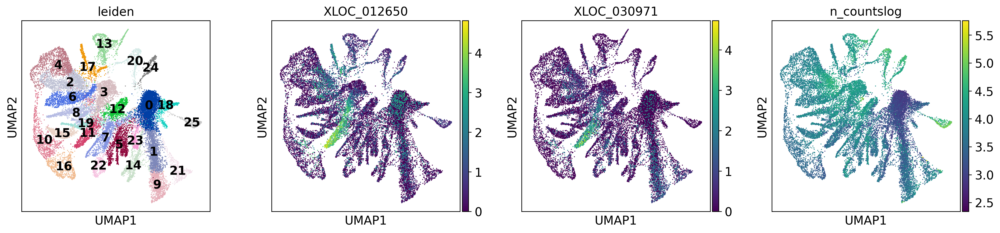

In [15]:
sc.pl.umap(bus_stim, color=['leiden','XLOC_012650','XLOC_030971','n_countslog'],legend_loc='on data',color_map='viridis')

In [17]:
#Assign labels to cells (condition and organism ID/#)
!mv D1.1817 jelly4stim_individs_tagCells_50k.mat
barcodes_list = sio.loadmat('jelly4stim_individs_tagCells_50k.mat')
barcodes_list.pop('__header__', None)
barcodes_list.pop('__version__', None)
barcodes_list.pop('__globals__', None)

# Add all cell barcodes for each individual
barcodes = []
for b in barcodes_list:
    if barcodes_list[b] != "None":
        barcodes.append(b)

print(len(barcodes))

barcodes = [s.replace('-1', '-3') for s in barcodes]
barcodes = [s.replace('-2', '-1') for s in barcodes]
barcodes = [s.replace('-3', '-2') for s in barcodes]



#Flip -1 -2 labels (from Miseq/Hiseq lane ordering)
def convertCode(b_list):
    b_list = [s.replace('-1', '-3') for s in b_list]
    b_list = [s.replace('-2', '-1') for s in b_list]
    b_list = [s.replace('-3', '-2') for s in b_list]
    return b_list

def convertCode_str(b):
    b = b.replace('-1', '-3')
    b = b.replace('-2', '-1')
    b = b.replace('-3', '-2')
    return b

fixed_bars = {}
for b in barcodes:
    fixed_bars[b] = barcodes_list[convertCode_str(b)][0]

#Add condition labels to individuals   
ids = []
for name in bus_stim.obs_names.tolist():
    for barcode, individ in fixed_bars.items():    
        if (name in barcode):
            ids += [int(individ)]

condition = ['SW','SW','SW','SW','DI','DI','DI','DI','KCl','KCl','KCl','KCl']

#Add ID numbers to individuals  
labels = []
for name in bus_stim.obs_names.tolist():
    for barcode, individ in fixed_bars.items():    
        if name in barcode:
            labels += [condition[int(individ)-1]]
            
bus_stim.obs['condition'] = pd.Categorical(labels)
bus_stim.obs['orgID'] = pd.Categorical(ids)
bus_stim

23058


Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 23057 × 10260
    obs: 'batch', 'n_counts', 'n_countslog', 'condition', 'orgID'
    var: 'n_counts'

In [20]:
#Remove low count region, '0'
bus_combo_noZero = bus_stim[~bus_stim.obs['leiden'].isin(['0'])]

bus_combo_noZero.write('bus_stim.h5ad')

###**Analysis of Stimulation Experiment with previously saved data**

In [18]:
#Saved Filtered and clustered h5ad

#Stimulation data
bus_stim_clus = anndata.read('D1.1821')

print(bus_stim_clus)

#Merged experimental data
overlap_combo = anndata.read('D1.1823')
overlap_combo 

AnnData object with n_obs × n_vars = 19054 × 10260
    obs: 'batch', 'n_counts', 'n_countslog', 'leiden', 'condition', 'orgID', 'cellRanger_louvain'
    var: 'n_counts'
    uns: 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', 'condition_colors', 'leiden', 'leiden_colors', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


AnnData object with n_obs × n_vars = 32727 × 6756
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'condition', 'cell_origin', 'knn_clus'
    var: 'n_counts-0', 'n_counts-1', 'mean', 'std'
    uns: 'pca'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'

In [19]:
#Starvation data
bus_fs_clus = anndata.read('D1.1796')

In [20]:
markers = pd.read_csv('D1.1809')
markers.head()

,clus,markerGene,annot,orthoGene,orthoDescr,pantherID,pantherDescr,source,Unnamed: 8,Unnamed: 9,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13
0,0.0,XLOC_010813,DDX39B,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],['PTHR24031:SF521'],['SPLICEOSOME RNA HELICASE DDX39B'],,NaN,NaN,NaN,NaN,NaN,NaN
1,0.0,XLOC_008430,PA2G4,PA2G4,proliferation-associated protein 2G4 [Homo sa...,['PTHR10804:SF125'],"['PROLIFERATION-ASSOCIATED 2G4 ,B']",,NaN,NaN,NaN,NaN,NaN,NaN
2,1.0,XLOC_016073,ZP3,NaN,NaN,['PTHR11576'],['ZONA PELLUCIDA SPERM-BINDING PROTEIN 3'],,NaN,NaN,NaN,NaN,NaN,NaN
3,2.0,XLOC_006164,LOT6,NaN,NaN,['PTHR30543:SF12'],['NAD(P)H-DEPENDENT FMN REDUCTASE LOT6'],,NaN,NaN,NaN,NaN,NaN,NaN
4,3.0,XLOC_013735,INXA,NaN,NaN,['PTHR11893:SF41'],['INNEXIN INX7'],,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
bus_stim_clus.obs['cellRanger_louvain'] = pd.Categorical(overlap_combo[overlap_combo.obs['cell_origin'] == 'Stim'].obs['knn_clus'])

In [ ]:
# Exact values for generating UMAP/PAGA embedding for stimulation data
# sc.pp.neighbors(bus_stim_clus,n_neighbors=30, n_pcs=30) #use_rep='X_nca'
# sc.tl.paga(bus_stim_clus, groups='cellRanger_louvain')
# sc.pl.paga(bus_stim_clus, color=['cellRanger_louvain'])
#sc.tl.umap(bus_stim_clus,random_state=42,init_pos='paga',spread=2.5) #min_dist=0.5,spread=3,   min_dist=0.3, spread=2.5,min_dist = 0.8

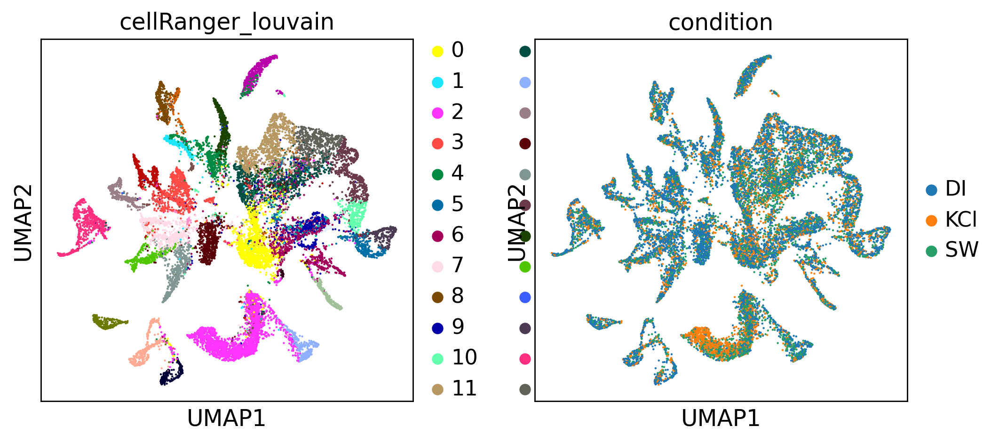

In [ ]:
#bus_stim_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
sc.pl.umap(bus_stim_clus, color=['cellRanger_louvain','condition'],color_map='viridis')

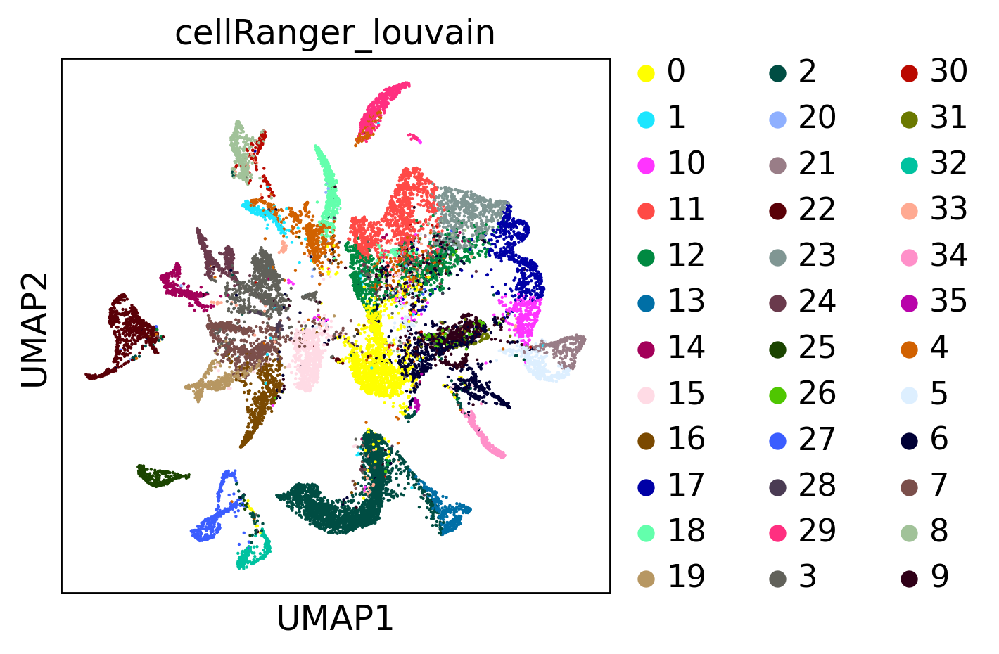

In [ ]:
sc.pl.umap(bus_stim_clus, color=['cellRanger_louvain'],color_map='viridis')

In [ ]:
# Saved adata usedd for this analysis
# bus_stim_clus.write('bus_stim_clus.h5ad')

####**Application of Cluster Labels/Analysis of Label Fit**

In [21]:
#Names for 36 subclusters
def annotateLouvainSub(bus_fs_clus):
  cluster_types = []
  
  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12]:
      cluster_types += ['Nematocyte Precursors']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [17]:
      cluster_types += ['Mature Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [11]:
      cluster_types += ['Early Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [23]:
      cluster_types += ['Late Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [2]:
      cluster_types += ['Medium Oocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [13]:
      cluster_types += ['Small Oocytes']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [7]:
      cluster_types += ['GastroDigestive-B']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [15]:
      cluster_types += ['GastroDigestive-D']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [3]:
      cluster_types += ['GastroDigestive-A']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [14]:
      cluster_types += ['GastroDigestive-C']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [19]:
      cluster_types += ['GastroDigestive-E']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [24]:
      cluster_types += ['GastroDigestive-F']


    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5]:
      cluster_types += ['Mechanosensory Precursors']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [10]:
      cluster_types += ['Developing Mechanosensory Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [21]:
      cluster_types += ['Mature Mechanosensory Cells']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [0]:
      cluster_types += ['i-Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1]:
      cluster_types += ['Exumbrella Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [4]:
      cluster_types += ['Manubrium Epidermis']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6]:
      cluster_types += ['Neuroblasts/early stages']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [9]:
      cluster_types += ['GLWamide/MIH Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [26]:
      cluster_types += ['RFamide Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [31]:
      cluster_types += ['YFamide Cells']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [8]:
      cluster_types += ['Striated Muscle - Subumbrella']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [16]:
      cluster_types += ['Tentacle Bulb Distal Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [18]:
      cluster_types += ['Radial Smooth Muscles']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [20]:
      cluster_types += ['Tentacle Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [22]:
      cluster_types += ['Gland Cells-A']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [25]:
      cluster_types += ['Gland Cells-C']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [27]:
      cluster_types += ['Gland Cells-B']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Tentacle Bioluminescent Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [29]:
      cluster_types += ['Gonad Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [30]:
      cluster_types += ['Striated Muscle - Velum']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [32]:
      cluster_types += ['Gland Cells-D']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [33]:
      cluster_types += ['Endodermal Plate']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34]:
      cluster_types += ['Gland Cells-E']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35]:
      cluster_types += ['Very Early Oocytes']
    
  bus_fs_clus.obs['annosSub'] = pd.Categorical(cluster_types)

annotateLouvainSub(bus_stim_clus)
bus_stim_clus

AnnData object with n_obs × n_vars = 19054 × 10260
    obs: 'batch', 'n_counts', 'n_countslog', 'leiden', 'condition', 'orgID', 'cellRanger_louvain', 'annosSub'
    var: 'n_counts'
    uns: 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', 'condition_colors', 'leiden', 'leiden_colors', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

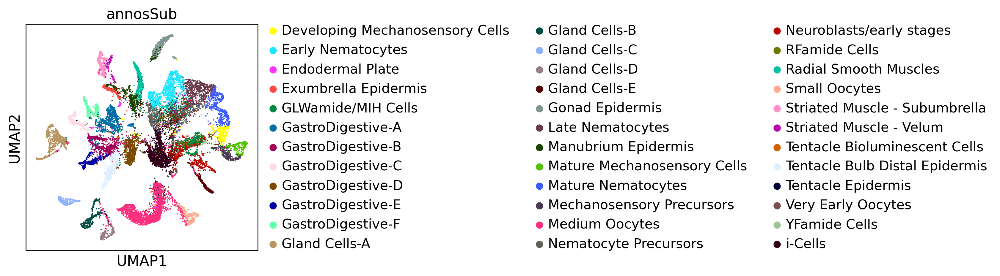

In [22]:
sc.pl.umap(bus_stim_clus,color='annosSub')

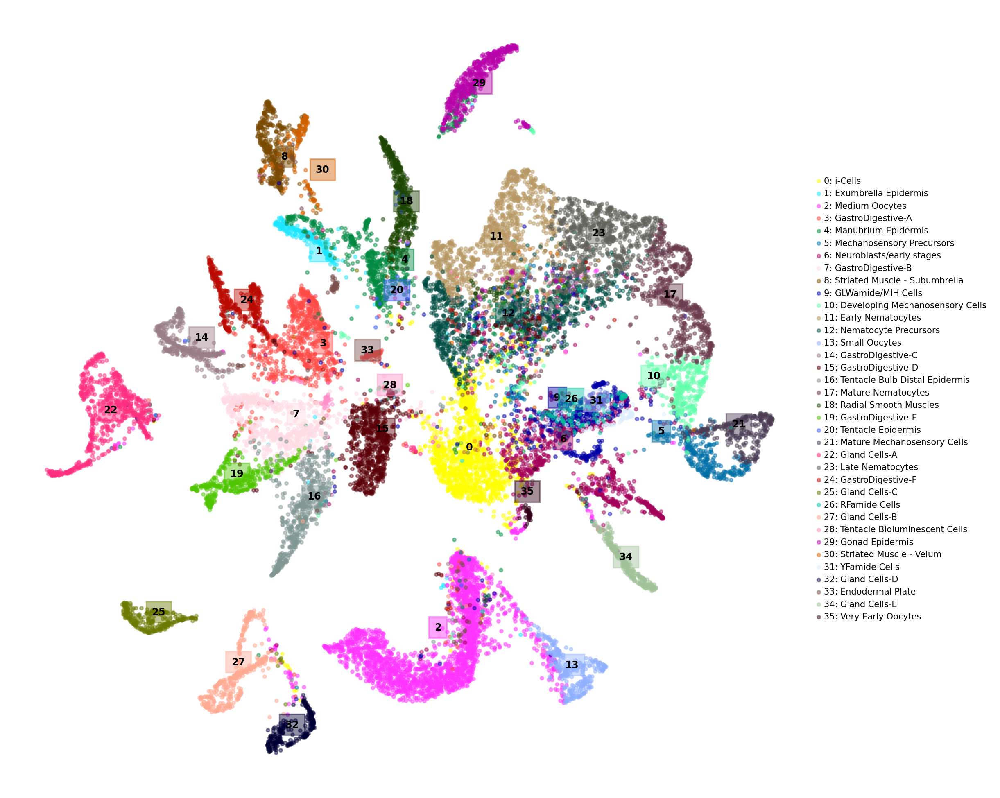

In [23]:
colors = bus_stim_clus.uns['annosSub_colors']#bus_fs_clus.uns['annosSub_colors']
colors
fig, ax = plt.subplots(figsize=(10,10))

c = np.unique(bus_stim_clus.obs["cellRanger_louvain"].values)
cmap = [i+'70' for i in colors]#plt.cm.get_cmap("tab20")


names = c

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = bus_stim_clus[bus_stim_clus.obs.cellRanger_louvain.isin([cluster]),:].obsm["X_umap"]
    text = list(bus_stim_clus[bus_stim_clus.obs.cellRanger_louvain.isin([cluster]),:].obs.annosSub)[0]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap[idx], label=str(cluster)+': '+text,s=5)
    ax.annotate(name, 
             (np.mean(x), np.mean(y)),
             horizontalalignment='center',
             verticalalignment='bottom',
             size=7, weight='bold',
             color="black",
               backgroundcolor=cmap[idx]) 
    

ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 6},frameon=False)
ax.set_axis_off()
plt.savefig('36ClusAtlas_Stim.pdf') 
plt.show()

In [24]:
#Subsample for clusters > 100 in size
#Subsample from full dataset, across each cluster
def subSample(adata):
  groups = np.unique(adata.obs['cellRanger_louvain'])
  subSample = 100
  cellNames = np.array(adata.obs_names)

  allCells = []
  for i in groups:
      #subSample =  clusSize[i] # REMOVE IF NOT LOOKING AT SIMILARLY SIZED CLUSTERS
      
      cells = np.array(list(adata.obs['cellRanger_louvain'].isin([i])))
      cellLocs = list(np.where(cells)[0])
      
      if len(cellLocs) > 100:
      #Take all cells if < subSample
        choice = random.sample(cellLocs,subSample)
      else:
        choice = cellLocs
     
      pos = list(choice)
      #print(len(pos))
      
      allCells += list(cellNames[pos])

      
  sub = adata[allCells,:]
  return sub

In [25]:
# #Filtered list of top markers
topMarkers = pd.read_csv('D1.1809',sep=",")
#topMarkers.head()

topMarkers = topMarkers[0:51]

topGenes = []
names = []
var_groups = []
var_labels = []
ind = 0
#n_genes = 2
for i in np.unique(topMarkers.clus):
  sub = topMarkers[topMarkers.clus == i]
  #sub.sort_values(by='padj',ascending=True)

  #noDups = [i for i in sub.markerGene if i not in topGenes] #Remove duplicate genes
  topGenes += list(sub.markerGene)
  names += list(sub.annot)

  var_groups += [(ind,ind+len(list(sub.annot))-1)]
  var_labels += [str(int(i))] #make i from clusNameDict[i]
  ind += len(list(sub.annot))


Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.var` of view, copying.
... storing 'names' as categorical


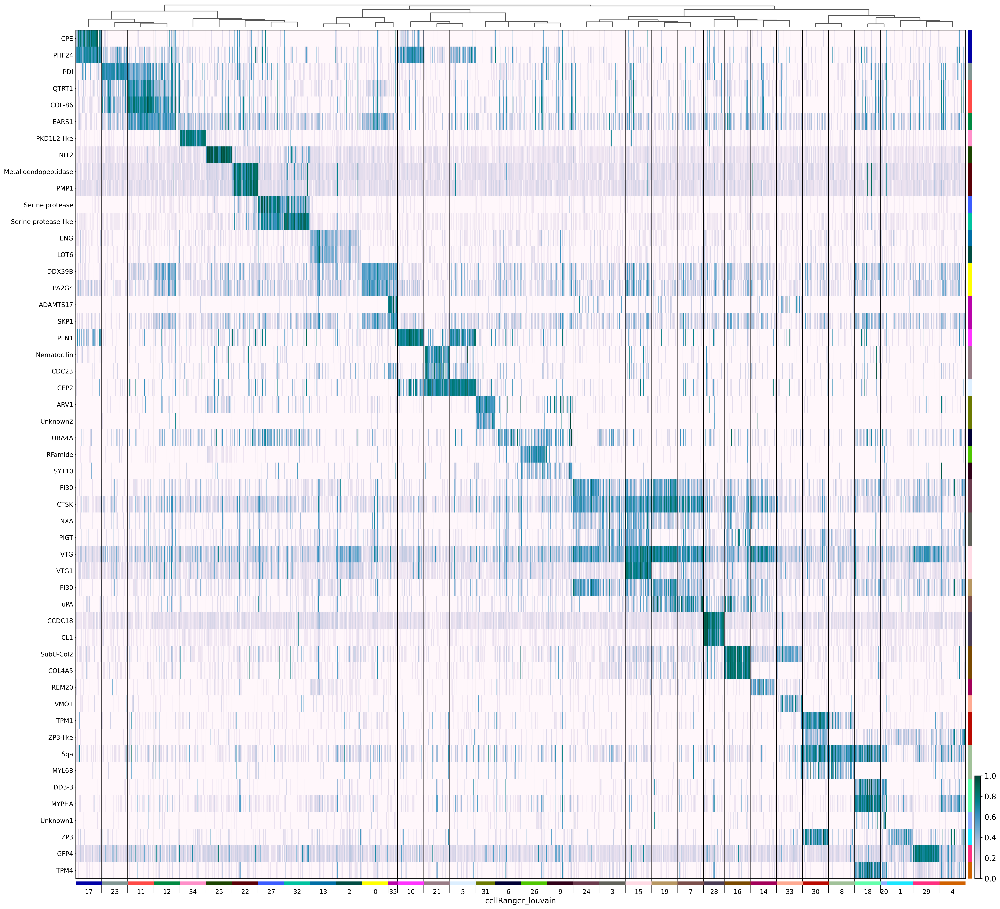

In [26]:
bus_stim_clus.obs['cellRanger_louvain'] = [str(i) for i in bus_stim_clus.obs['cellRanger_louvain']]
bus_stim_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_stim_clus.obs['cellRanger_louvain'])
#Create dendrogram for subclusters
sc.tl.dendrogram(bus_stim_clus,'cellRanger_louvain',linkage_method='ward')
bus_stim_clus.uns["dendrogram_cellRanger_louvain"] = bus_stim_clus.uns["dendrogram_['cellRanger_louvain']"]

bus_stim_clusSub = subSample(bus_stim_clus)

#Raw, unclustered h5ad
bus_stim = anndata.read('D1.1814')
sc.pp.filter_cells(bus_stim, min_counts=1)
sc.pp.filter_genes(bus_stim, min_counts=1)

bus_stim = bus_stim[bus_stim_clusSub.obs_names,:]
bus_stim.obs['cellRanger_louvain'] = bus_stim_clusSub.obs['cellRanger_louvain']
bus_stim.uns['cellRanger_louvain_colors'] = bus_stim_clus.uns['annosSub_colors']
bus_stim.uns["dendrogram_cellRanger_louvain"] = bus_stim_clusSub.uns["dendrogram_cellRanger_louvain"]


bus_stim = bus_stim[:,topGenes]
bus_stim.var['names'] = names

sc.pp.log1p(bus_stim)

sc.pl.heatmap(bus_stim,names,groupby='cellRanger_louvain',dendrogram=True,show_gene_labels=True,cmap='PuBuGn',use_raw = False,
                var_group_positions=var_groups,var_group_labels=var_labels,figsize = (30,30),swap_axes=True,standard_scale='var',
              gene_symbols='names',save='stimAtlas.pdf')

Jaccard Marker Overlap Comparison

In [27]:
n=100
bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
sc.tl.rank_genes_groups(bus_stim_clus,groupby='cellRanger_louvain',n_genes=n,method='wilcoxon')
sc.tl.rank_genes_groups(bus_fs_clus,groupby='cellRanger_louvain',n_genes=n,method='wilcoxon')

In [28]:
#Show pairwise overlap in top 100 names between all clusters, 36x36 grid
#https://stackoverflow.com/questions/52408910/python-pairwise-intersection-of-multiple-lists-then-sum-up-all-duplicates

clus = np.unique(bus_fs_clus.obs['cellRanger_louvain'])

busStim = [[]]*len(clus) #np array of top 100 genes for each of 36 clusters
busFS = [[]]*len(clus)#np array of top 100 genes for each of 36 clusters

for c in clus:
  busStim[c] =  list(bus_stim_clus.uns['rank_genes_groups']['names'][str(c)])
  busFS[c] = list(bus_fs_clus.uns['rank_genes_groups']['names'][str(c)])


In [29]:
from itertools import combinations_with_replacement

#Changed to calculate Jaccard Index
def intersect(i,j):
  return len(set(busStim[i]).intersection(busFS[j]))/len(set(busStim[i]).union(busFS[j]))

def pairwise(clus):        
  # Initialise precomputed matrix (num of clusters, 36x36)
  precomputed = np.zeros((len(clus),len(clus)), dtype='float')
  # Initialise iterator over objects in X
  iterator = combinations_with_replacement(range(0,len(clus)), 2)
  # Perform the operation on each pair
  for i,j in iterator:
    precomputed[i,j] = intersect(i,j)          
  # Make symmetric and return
  return precomputed + precomputed.T - np.diag(np.diag(precomputed))


In [30]:
pairCorrs = pairwise(clus)

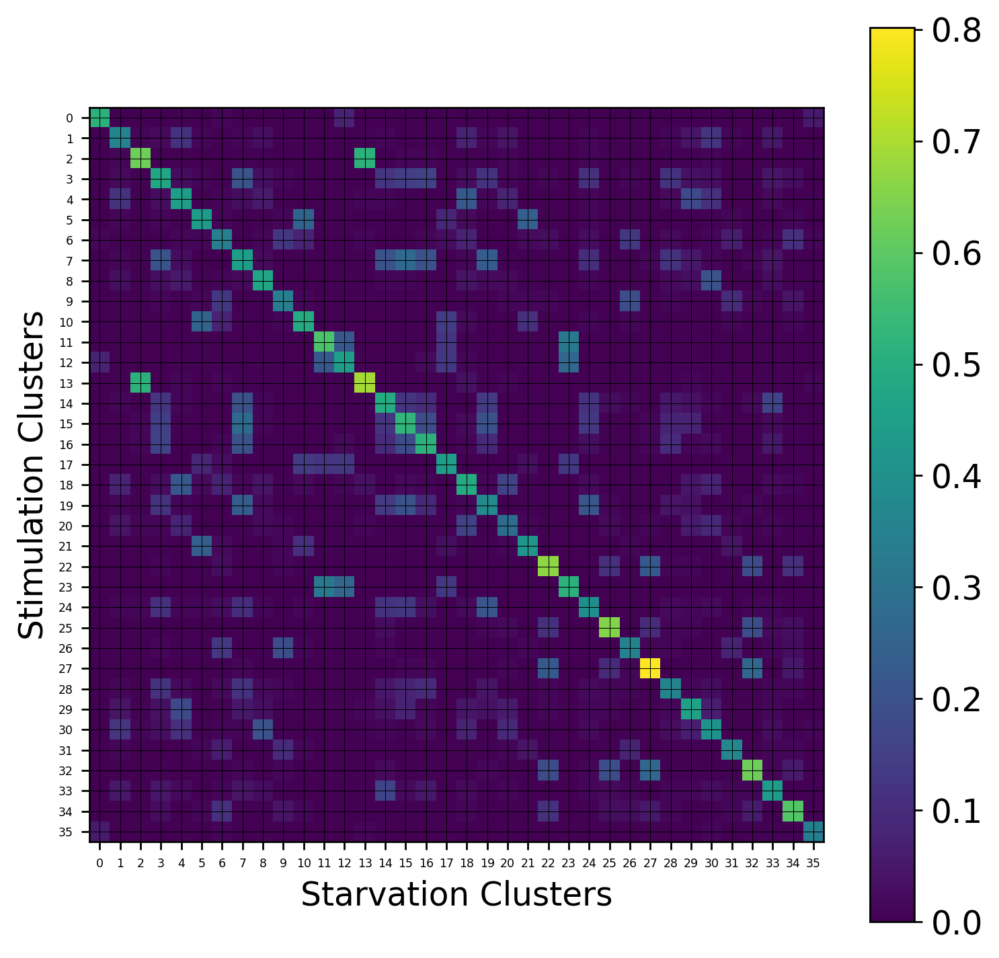

In [31]:
plt.figure(figsize=(7,7))
plt.imshow(pairCorrs, cmap='viridis')
plt.colorbar()
plt.xlabel('Starvation Clusters')
plt.ylabel('Stimulation Clusters')

plt.xticks(np.arange(0, 36, 1),fontsize=5)
plt.yticks(np.arange(0, 36, 1),fontsize=5)
plt.grid(color='black',linewidth=0.3)
plt.show()

####**DeSeq2 Analysis Across Clusters**

In [ ]:
#Remove clusters with < 10 cells per condition
bus_stim = anndata.read("D1.1814")

bus_stim = bus_stim[bus_stim_clus.obs_names,]
#bus_fs_raw.obs['orgID'] = bus_fs_clus.obs['orgID']
bus_stim.obs['condition'] = bus_stim_clus.obs['condition']
bus_stim.obs['cellRanger_louvain'] = bus_stim_clus.obs['cellRanger_louvain']
bus_stim


#clusSize

Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 19054 × 46716
    obs: 'batch', 'condition', 'cellRanger_louvain'

In [ ]:
def clusToKeep(bus_fs_clus):
  keep = []
  clusSize = {}
  for i in np.unique(bus_fs_clus.obs['cellRanger_louvain']):
      cells = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([i])]
      kcl_cells = len(cells[cells.obs['condition']=='KCl'].obs_names)
      di_cells = len(cells[cells.obs['condition']=='DI'].obs_names)
      sw_cells = len(cells[cells.obs['condition']=='SW'].obs_names)
      min_cells = np.min([kcl_cells,di_cells,sw_cells])
      if min_cells > 10:
        keep += [i]
        #clusSize[i] = min_cells
  return keep

In [ ]:
#Subsample from full dataset, across each cluster
def getSampled_Cluster(bus_fs_clus,bus_fs_raw,keep):

  subSample = 100
  cellNames = np.array(bus_fs_clus.obs_names)
  kcl = np.array(list(bus_fs_clus.obs['condition'] == 'KCl'))
  di = np.array(list(bus_fs_clus.obs['condition'] == 'DI'))
  sw = np.array(list(bus_fs_clus.obs['condition'] == 'SW'))

  allCells = []
  for i in keep:
      #subSample =  clusSize[i] 
      
      cells = np.array(list(bus_fs_clus.obs['cellRanger_louvain'].isin([i])))
      kcl_cells = list(np.where(kcl & cells)[0])
      di_cells = list(np.where(di & cells)[0])
      sw_cells = list(np.where(sw & cells)[0])
      
      #Take all cells if < subSample
      if len(kcl_cells) >= subSample:
          kcl_choice = random.sample(kcl_cells,subSample)
      else:
          kcl_choice = kcl_cells

      if len(di_cells) >= subSample:
          di_choice = random.sample(di_cells,subSample)
      else:
          di_choice = di_cells
          
      if len(sw_cells) >= subSample:
          sw_choice = random.sample(sw_cells,subSample)
      else:
          sw_choice = sw_cells
          
          
      pos = list(kcl_choice)+list(di_choice)+list(sw_choice)
      #print(len(pos))
      
      allCells += list(cellNames[pos])

      
  sub_raw = bus_fs_raw[allCells,:]
  return sub_raw

In [ ]:
#For full dataset don't filter by highly variable
keep = clusToKeep(bus_stim_clus)
sub_raw = getSampled_Cluster(bus_stim_clus,bus_stim,keep)


sub_raw_copy = sub_raw.copy()

sc.pp.filter_cells(sub_raw, min_counts=0)
sc.pp.filter_genes(sub_raw, min_counts=1)

sub_raw

# sc.pp.normalize_per_cell(sub_raw_copy, counts_per_cell_after=1e4)
# sub_raw_copy.raw = sc.pp.log1p(sub_raw_copy, copy=True)

# sc.pp.highly_variable_genes(sub_raw_copy,n_top_genes=5000) #This is just a small example, for full data used all nonzero genes
# sub_raw = sub_raw[:,sub_raw_copy.var['highly_variable']]


Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 8535 × 36993
    obs: 'batch', 'condition', 'cellRanger_louvain', 'n_counts'
    var: 'n_counts'

In [ ]:
#Instantiate dataframe with gene names
def makeDF_forR(sub_raw):
  fullDF = pd.DataFrame(scipy.sparse.csr_matrix.toarray(sub_raw.X).T, index = sub_raw.var_names.tolist(), columns= sub_raw.obs_names.tolist())
  conds = sub_raw.obs['condition'].tolist()
  #ids = sub_jelly4Raw.obs['orgID'].tolist()
  clus = sub_raw.obs['cellRanger_louvain'].tolist()

  reps = np.repeat(0,len(sub_raw.obs_names))

  length = len(sub_raw[sub_raw.obs['condition'] == 'KCl'].obs_names)
  reps[sub_raw.obs['condition'] == 'KCl'] = range(1,length+1)

  length = len(sub_raw[sub_raw.obs['condition'] == 'DI'].obs_names)
  reps[sub_raw.obs['condition'] == 'DI'] = range(1,length+1)

  length = len(sub_raw[sub_raw.obs['condition'] == 'SW'].obs_names)
  reps[sub_raw.obs['condition'] == 'SW'] = range(1,length+1)


  sampleDF = pd.DataFrame({'cell_ID': fullDF.columns}) \
          .assign(condition = conds) \
          .assign(replicate = reps) \
          .assign(cluster = clus) 
  sampleDF.index = sampleDF.cell_ID
  sampleDF.head()

  fullDF.to_csv('fullDF.csv')
  sampleDF.to_csv('sampleDF.csv')

In [ ]:
makeDF_forR(sub_raw)

In [ ]:
%%R 
fullDF <- read.csv(file = 'fullDF.csv')
sampleDF <- read.csv(file = 'sampleDF.csv')
head(sampleDF)

             cell_ID          cell_ID.1 condition replicate cluster
1 GAAGGACAGCACGATG-2 GAAGGACAGCACGATG-2       KCl         1       0
2 CCTCCTCAGGATGCGT-2 CCTCCTCAGGATGCGT-2       KCl         2       0
3 GGCTGTGAGTGTGTTC-1 GGCTGTGAGTGTGTTC-1       KCl         3       0
4 TTATTGCAGAGCGACT-1 TTATTGCAGAGCGACT-1       KCl         4       0
5 TCAAGTGAGAGGGCGA-2 TCAAGTGAGAGGGCGA-2       KCl         5       0
6 AGGCTGCTCGAGAGCA-1 AGGCTGCTCGAGAGCA-1       KCl         6       0


In [ ]:
%%R
rownames(sampleDF) <- sampleDF$cell_ID 
#Replace '.' in cell barcodes with '-'
rownames(fullDF) <- fullDF$X
colnames(fullDF) <- gsub("\\.", "-", colnames(fullDF))
fullDF <- subset(fullDF, select = -c(X) )
#head(fullDF)

sampleDF <- subset(sampleDF, select = -c(cell_ID.1) )
head(sampleDF)
sampleDF$condition <- factor(sampleDF$condition) #labels = c("starved", "fed")

In [ ]:
%%R
head(sampleDF)

                              cell_ID condition replicate cluster
GAAGGACAGCACGATG-2 GAAGGACAGCACGATG-2       KCl         1       0
CCTCCTCAGGATGCGT-2 CCTCCTCAGGATGCGT-2       KCl         2       0
GGCTGTGAGTGTGTTC-1 GGCTGTGAGTGTGTTC-1       KCl         3       0
TTATTGCAGAGCGACT-1 TTATTGCAGAGCGACT-1       KCl         4       0
TCAAGTGAGAGGGCGA-2 TCAAGTGAGAGGGCGA-2       KCl         5       0
AGGCTGCTCGAGAGCA-1 AGGCTGCTCGAGAGCA-1       KCl         6       0


In [ ]:
%%R
install.packages("BiocManager")
BiocManager::install(version = "3.10")


R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/BiocManager_1.30.10.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 40205 bytes (39 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[


Error: Bioconductor version '3.10' requires R version '3.6'; see
  https://bioconductor.org/install


In [ ]:
!sudo apt-get update
!sudo apt-get install libxml2-dev
!sudo apt-get install r-cran-xml
!sudo apt-get install libcurl4-openssl-dev

Hit:1 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Hit:5 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:6 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:7 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Ign:8 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:9 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ Packages [39.3 kB]
Get:10 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic/main Sources [1,685 kB]
Ign:11 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:12 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release [697 B

In [ ]:
%%R 
#install.packages("DESeq2",repos = "http://cran.us.r-project.org")
BiocManager::install("DESeq2")

R[write to console]: Bioconductor version 3.11 (BiocManager 1.30.10), R 4.0.3 (2020-10-10)

R[write to console]: Installing package(s) 'BiocVersion', 'DESeq2'

R[write to console]: also installing the dependencies ‘bit’, ‘bitops’, ‘formatR’, ‘bit64’, ‘plogr’, ‘RCurl’, ‘GenomeInfoDbData’, ‘zlibbioc’, ‘matrixStats’, ‘lambda.r’, ‘futile.options’, ‘RSQLite’, ‘xtable’, ‘GenomeInfoDb’, ‘XVector’, ‘DelayedArray’, ‘futile.logger’, ‘snow’, ‘AnnotationDbi’, ‘annotate’, ‘S4Vectors’, ‘IRanges’, ‘GenomicRanges’, ‘SummarizedExperiment’, ‘BiocGenerics’, ‘Biobase’, ‘BiocParallel’, ‘genefilter’, ‘locfit’, ‘geneplotter’, ‘RcppArmadillo’


R[write to console]: trying URL 'https://cran.rstudio.com/src/contrib/bit_4.0.4.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 279723 bytes (273 KB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to con

In [ ]:
#Make output directory
!mkdir kallistoDEAnalysis_Stim

In [ ]:
%%R
library("DESeq2")

R[write to console]: Loading required package: S4Vectors

R[write to console]: Loading required package: stats4

R[write to console]: Loading required package: BiocGenerics

R[write to console]: Loading required package: parallel

R[write to console]: 
Attaching package: ‘BiocGenerics’


R[write to console]: The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


R[write to console]: The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


R[write to console]: The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, 

In [ ]:
%%R 
#nstall.packages("DESeq2",repos = "http://cran.us.r-project.org")

#library("apeglm")
#library(Rcpp)
#.libPaths()

clusters <- unique(sampleDF$cluster)
Genes <- c()
Cluster <- c()
Condition <- c() 
padj <- c()
log2FC <- c()

for (i in clusters){
 
        indices = which(sampleDF$cluster == i)
        subset = fullDF[,indices]
        subset_meta = subset(sampleDF,cluster == i)


        dds <- DESeqDataSetFromMatrix(countData = subset, colData = subset_meta, design= ~replicate + condition)

        #Set control condition
        dds$condition <- relevel(dds$condition, ref = 'SW')
        dds <- DESeq(dds,test="LRT", reduced=~replicate, sfType="poscounts", useT=TRUE, minmu=1e-6, 
                     minReplicatesForReplace=Inf,betaPrior = FALSE)#parallel = TRUE

        fc = 1 #usually fold change cutoff
        #SW v KCl results
        res <- results(dds,alpha=0.05,name="condition_KCl_vs_SW")
        resLFC <- res 

        resLFC <- na.omit(resLFC)
        resOrdered <- resLFC[resLFC$padj < .05,]
        #Keep log2 fold changes < -1 or > 1
        resOrdered <- resOrdered[abs(resOrdered$log2FoldChange) > fc,]
        outcomes <- resOrdered[order(resOrdered$padj),]

        Genes <- c(Genes,row.names(outcomes))
        Cluster <- c(Cluster,rep(i,length(row.names(outcomes))))
        Condition <- c(Condition,rep('KCl',length(row.names(outcomes)))) 
        padj <- c(padj,outcomes$padj)
        log2FC <- c(log2FC,outcomes$log2FoldChange)


        #SW v DI results
        res <- results(dds,alpha=0.05,name="condition_DI_vs_SW")
        resLFC <- res 

        resLFC <- na.omit(resLFC)
        resOrdered <- resLFC[resLFC$padj < .05,]
        #Keep log2 fold changes < -1 or > 1
        resOrdered <- resOrdered[abs(resOrdered$log2FoldChange) > fc,] 
        outcomes <- resOrdered[order(resOrdered$padj),]

        Genes <- c(Genes,row.names(outcomes))
        Cluster <- c(Cluster,rep(i,length(row.names(outcomes))))
        Condition <- c(Condition,rep('DI',length(row.names(outcomes)))) 
        padj <- c(padj,outcomes$padj)
        log2FC <- c(log2FC,outcomes$log2FoldChange)
         
    
}

deGenesDF <- data.frame(matrix(ncol = 6, nrow = length(Genes)))
names(deGenesDF) <- c("Genes", "Cluster", "Condition","padj","padjClus","log2FC")

deGenesDF$Genes <- Genes
deGenesDF$Cluster <- Cluster
deGenesDF$Condition <- Condition
deGenesDF$padj <- padj
deGenesDF$padjClus <- padj*length(unique(Cluster))
deGenesDF$log2FC <- log2FC

write.csv(deGenesDF,'./kallistoDEAnalysis_Stim/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv')

head(deGenesDF)

In [ ]:
%%R
install.packages("UpSetR",repos = "http://cran.us.r-project.org")

R[write to console]: Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

R[write to console]: also installing the dependencies ‘gridExtra’, ‘plyr’


R[write to console]: trying URL 'http://cran.us.r-project.org/src/contrib/gridExtra_2.3.tar.gz'

R[write to console]: Content type 'application/x-gzip'
R[write to console]:  length 1062844 bytes (1.0 MB)

R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to console]: =
R[write to consol

In [ ]:
%%R -w 20 -h 20 --units in -r 500
#install.packages("UpSetR",repos = "http://cran.us.r-project.org")
#Cite http://people.seas.harvard.edu/~alex/papers/2014_infovis_upset.pdf
library("UpSetR")

deGenesDF <- read.csv(file = './kallistoDEAnalysis_Stim/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv')

#Bonferronni correction across clusters
deGenesDF_toPlot = subset(deGenesDF,padjClus < .05)

kcl_toPlot = subset(deGenesDF,Condition =='KCl')
di_toPlot = subset(deGenesDF,Condition =='DI')
#deGenesDF_toPlot = subset(deGenesDF_toPlot,abs(log2FC) < 10) #Remove genes from plot that are inflated by zero expression in other cells

# Create empty list to store vectors
vecsToPlot <- list()

clusters = unique(kcl_toPlot$Cluster)
for (i in 1:length(clusters)){
    subset = subset(kcl_toPlot,Cluster == clusters[i])
    vecsToPlot[[i]] <- unique(subset$Genes)
}

names(vecsToPlot) <- clusters

upset(fromList(vecsToPlot), sets = as.character(clusters),nintersects= NA,order.by = "freq",
      mainbar.y.label='Number of Genes in Intersection',
      sets.x.label = 'Number of Perturbed Genes',
      text.scale = c(3, 3, 3, 3, 3, 1.3),
      show.numbers = "no",
      point.size = 2.8,
      mb.ratio= c(0.6, 0.4),
      queries = list(list(query = intersects, params = list("2"), color = "firebrick",active = T),
                     list(query = intersects, params = list("25"), color = "firebrick",active = T),
                     list(query = intersects, params = list("24"), color = "firebrick",active = T),
                     list(query = intersects, params = list("6"), color = "firebrick",active = T),
                     list(query = intersects, params = list("0"), color = "firebrick",active = T),
                     list(query = intersects, params = list("14"), color = "firebrick",active = T),
                     list(query = intersects, params = list("7"), color = "firebrick",active = T),
                     list(query = intersects, params = list("13"), color = "firebrick",active = T),
                     list(query = intersects, params = list("15"), color = "firebrick",active = T),
                     list(query = intersects, params = list("9"), color = "firebrick",active = T),
                     list(query = intersects, params = list("22"), color = "firebrick",active = T),
                     list(query = intersects, params = list("12"), color = "firebrick",active = T),
                     list(query = intersects, params = list("5"), color = "firebrick",active = T),
                     list(query = intersects, params = list("4"), color = "firebrick",active = T),
                     list(query = intersects, params = list("18"), color = "firebrick",active = T),
                     list(query = intersects, params = list("1"), color = "firebrick",active = T),
                     list(query = intersects, params = list("13"), color = "firebrick",active = T),
                     list(query = intersects, params = list("19"), color = "firebrick",active = T),
                     list(query = intersects, params = list("10"), color = "firebrick",active = T),
                     list(query = intersects, params = list("8"), color = "firebrick",active = T),
                     list(query = intersects, params = list("16"), color = "firebrick",active = T),
                     list(query = intersects, params = list("23"), color = "firebrick",active = T),
                     list(query = intersects, params = list("30"), color = "firebrick",active = T),
                     list(query = intersects, params = list("3"), color = "firebrick",active = T))) #Add queries

In [ ]:
%%R -w 20 -h 20 --units in -r 500
# Create empty list to store vectors
vecsToPlot <- list()

clusters = unique(di_toPlot$Cluster)
for (i in 1:length(clusters)){
    subset = subset(di_toPlot,Cluster == clusters[i])
    vecsToPlot[[i]] <- unique(subset$Genes)
}

names(vecsToPlot) <- clusters

upset(fromList(vecsToPlot), sets = as.character(clusters),nintersects= NA,order.by = "freq",
      mainbar.y.label='Number of Genes in Intersection',
      sets.x.label = 'Number of Perturbed Genes',
      text.scale = c(3, 3, 3, 3, 3, 1.3),
      show.numbers = "no",
      point.size = 2.8,
      mb.ratio= c(0.6, 0.4),
      queries = list(list(query = intersects, params = list("25"), color = "firebrick",active = T),
                     list(query = intersects, params = list("6"), color = "firebrick",active = T),
                     list(query = intersects, params = list("9"), color = "firebrick",active = T),
                     list(query = intersects, params = list("13"), color = "firebrick",active = T),
                     list(query = intersects, params = list("3"), color = "firebrick",active = T),
                     list(query = intersects, params = list("24"), color = "firebrick",active = T),
                     list(query = intersects, params = list("2"), color = "firebrick",active = T),
                     list(query = intersects, params = list("14"), color = "firebrick",active = T),
                     list(query = intersects, params = list("5"), color = "firebrick",active = T),
                     list(query = intersects, params = list("7"), color = "firebrick",active = T),
                     list(query = intersects, params = list("15"), color = "firebrick",active = T),
                     list(query = intersects, params = list("0"), color = "firebrick",active = T),
                     list(query = intersects, params = list("4"), color = "firebrick",active = T),
                     list(query = intersects, params = list("1"), color = "firebrick",active = T),
                     list(query = intersects, params = list("12"), color = "firebrick",active = T),
                     list(query = intersects, params = list("19"), color = "firebrick",active = T),
                     list(query = intersects, params = list("10"), color = "firebrick",active = T),
                     list(query = intersects, params = list("22"), color = "firebrick",active = T),
                     list(query = intersects, params = list("18"), color = "firebrick",active = T),
                     list(query = intersects, params = list("32"), color = "firebrick",active = T),
                     list(query = intersects, params = list("11"), color = "firebrick",active = T),
                     list(query = intersects, params = list("16"), color = "firebrick",active = T))) #Add queries

In [ ]:
deseq_df = pd.read_csv('./kallistoDEAnalysis_Stim/deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample.csv',
            sep=",")
deseq_df.head()

,Unnamed: 0,Genes,Cluster,Condition,padj,padjClus,log2FC
0,1,XLOC_035278,0,KCl,5.094103e-30,1.477290e-28,3.628020
1,2,XLOC_034855,0,KCl,4.266783e-11,1.237367e-09,-3.136739
2,3,XLOC_037467,0,KCl,6.103304e-11,1.769958e-09,1.994083
3,4,XLOC_018070,0,KCl,1.349041e-09,3.912220e-08,1.808532
4,5,XLOC_013243,0,KCl,2.095466e-08,6.076853e-07,1.555502


In [ ]:
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []


for g in deseq_df.Genes:
        
  sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
  panth_df = panther_df[panther_df[0].isin([g])]
  go_df = goTerm_df[goTerm_df[0].isin([g])]

  if len(sub_df) > 0:
    #Save first result for gene/description
    orthoGene += [list(sub_df.Gene)[0]]
    orthoDescr += [list(sub_df.Description)[0]]
  else:
    orthoGene += ['NA']
    orthoDescr += ['NA']


  if len(panth_df) > 0:
    #Save first result for gene/description
    pantherNum += [list(panth_df[1])]
    pantherDescr += [list(panth_df[2])]
  else:
    pantherNum += ['NA']
    pantherDescr += ['NA']


  if len(go_df) > 0:
    #Save first result for gene/description
    goTerms += [list(go_df[1])]
  else:
    goTerms += ['NA']
 
deseq_df['orthoGene'] = orthoGene
deseq_df['orthoDescr'] = orthoDescr

deseq_df['pantherID'] = pantherNum
deseq_df['pantherDescr'] = pantherDescr

deseq_df['goTerms'] = goTerms
deseq_df.head()

,Unnamed: 0,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,1,XLOC_035278,0,KCl,5.094103e-30,1.477290e-28,3.628020,NA,NA,NA,NA,NA
1,2,XLOC_034855,0,KCl,4.266783e-11,1.237367e-09,-3.136739,NA,NA,NA,NA,NA
2,3,XLOC_037467,0,KCl,6.103304e-11,1.769958e-09,1.994083,NA,NA,[PTHR22907],[UNCHARACTERIZED],[nan]
3,4,XLOC_018070,0,KCl,1.349041e-09,3.912220e-08,1.808532,NA,NA,[PTHR10334],[CYSTEINE-RICH SECRETORY PROTEIN-RELATED],[nan]
4,5,XLOC_013243,0,KCl,2.095466e-08,6.076853e-07,1.555502,NA,NA,NA,NA,[nan]


In [ ]:
deseq_df.to_csv('stim_deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample_annotations.csv') #D1.1818

#### **Neighbor Score Plots**

In [ ]:
#Calculate number of neighbors (out of top 15) with same starvation condition
#Input adata object and if score is for fed or starved (True or False)
def neighborScores(adata,conditionBool):
  sc.pp.neighbors(adata,n_neighbors=15)
  neighborDists = adata.uns['neighbors']['distances'].todense()
  counts = []

  for i in range(0,len(adata.obs_names)):
    cellNames = adata.obs_names
      
    #get condition observation for this cell
    cellObs = adata.obs['condition'][cellNames[i]]
      
    #get row for cell
    nonZero = neighborDists[i,:]>0
    l = nonZero.tolist()[0]

    cellRow = neighborDists[i,:]
    cellRow = cellRow[:,l]


    #get 'fed' observations
    obs = adata.obs['condition'][l]
      
    # count # in 'fed' observations == cell obs
    count = 0
    #if cellObs == conditionBool:
    for j in obs:
      if j == conditionBool:
        count += 1
              

    counts += [count]
      
  print(len(counts))

  return counts

19054


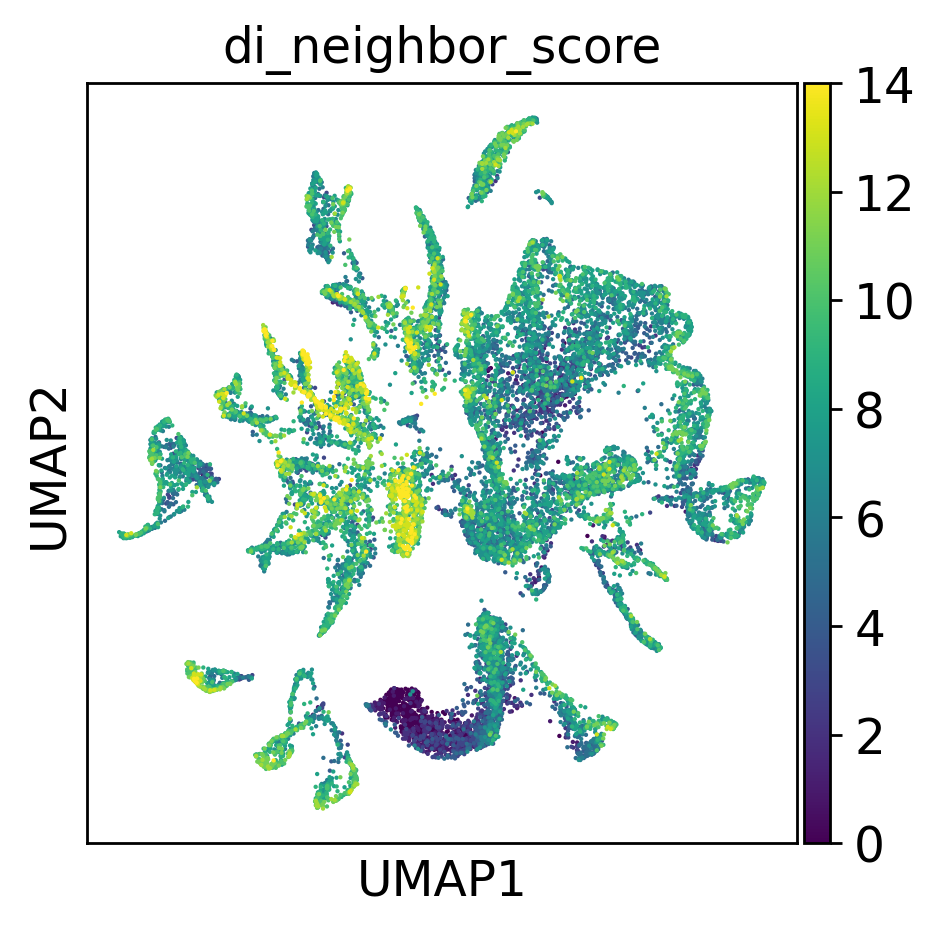

In [ ]:
bus_stim_clus.obs['di_neighbor_score'] = neighborScores(bus_stim_clus,'DI')
sc.pl.umap(bus_stim_clus,color='di_neighbor_score',color_map='viridis')


19054


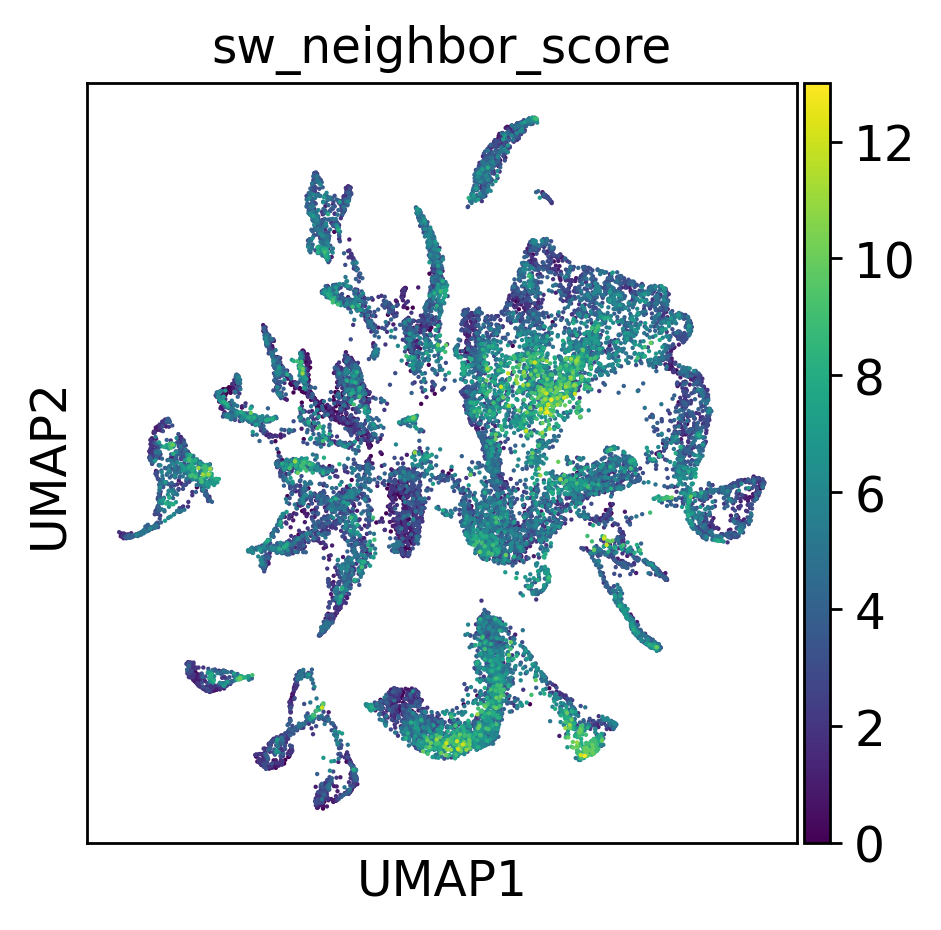

In [ ]:
bus_stim_clus.obs['sw_neighbor_score'] = neighborScores(bus_stim_clus,'SW')
sc.pl.umap(bus_stim_clus,color='sw_neighbor_score',color_map='viridis')


19054


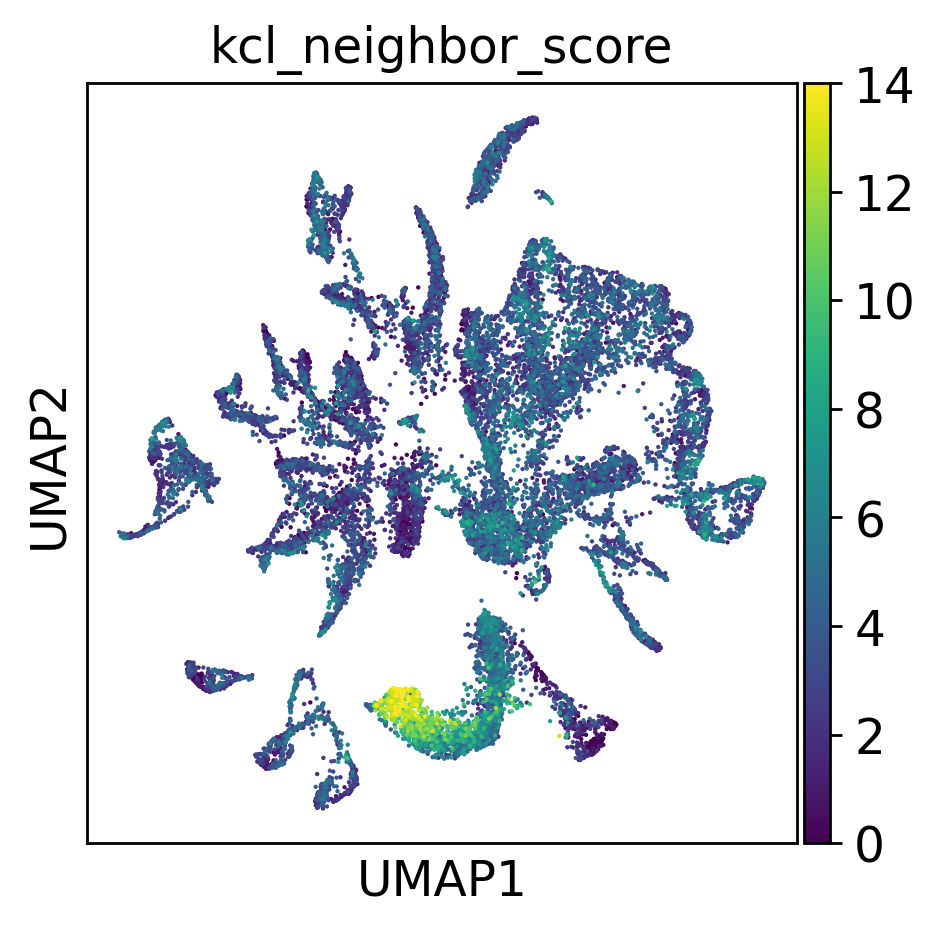

In [ ]:
bus_stim_clus.obs['kcl_neighbor_score'] = neighborScores(bus_stim_clus,'KCl')
sc.pl.umap(bus_stim_clus,color='kcl_neighbor_score',color_map='viridis')


#### **Neuron Subpopulations**

In [ ]:
fs_neuron = anndata.read('D1.1804')

,XLOC,Annotation,Class,Cluster
0,XLOC_030971,ELAV,NaN,0
1,XLOC_001566,Synaptotagmin,NaN,0
2,XLOC_030920,Neurogenin,NaN,0
3,XLOC_040584,GRWGamide,Peptide,7
4,XLOC_019434,Rfamide,Peptide,2


In [ ]:
#Raw, unclustered h5ad
bus_stim = anndata.read('D1.1814')
bus_stim = bus_stim[bus_stim_clus.obs_names,]
#Transfer info from embedded version
bus_stim.obs['cellRanger_louvain'] = pd.Categorical(bus_stim_clus.obs['cellRanger_louvain'])
bus_stim.obs['condition'] = pd.Categorical(bus_stim_clus.obs['condition'])

Trying to set attribute `.obs` of view, copying.


Trying to set attribute `.obs` of view, copying.


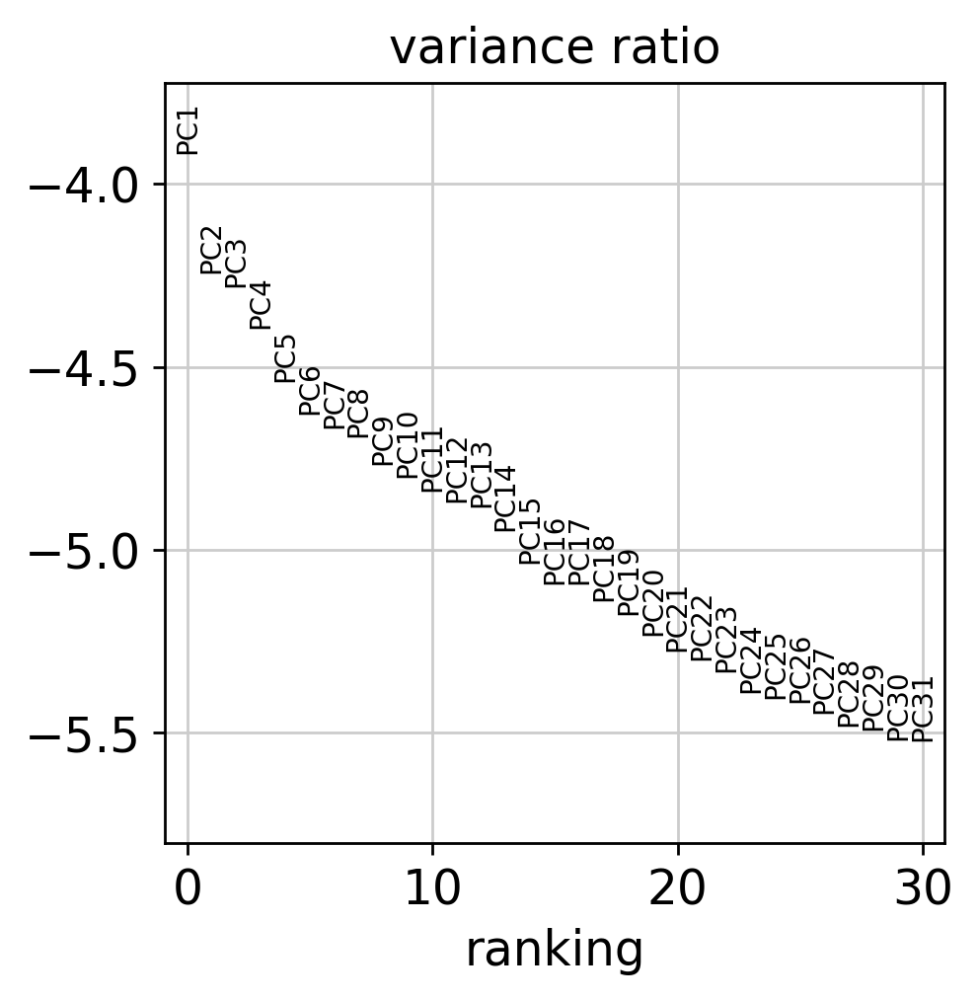

In [ ]:
#Neurons, start from raw counts + unfiltered genes
neurons = bus_stim[bus_stim.obs['cellRanger_louvain'].isin([31,26,6,9])]
sc.pp.filter_cells(neurons, min_counts=0)
sc.pp.filter_genes(neurons, min_counts=0)

sc.pp.normalize_per_cell(neurons, counts_per_cell_after=1e4)

neurons_copy = neurons.copy()
sc.pp.log1p(neurons)
neurons.raw = sc.pp.log1p(neurons_copy, copy=True)

# sc.pp.scale(raw_overlap_combo, max_value=10)
sc.pp.highly_variable_genes(neurons,n_top_genes=2000,n_bins=50)

neurons = neurons[:,neurons.var['highly_variable']]

sc.pp.scale(neurons, max_value=10)

sc.tl.pca(neurons, n_comps=60)
sc.pl.pca_variance_ratio(neurons, log=True)

#applyNCAEmbed(neurons,neurons.obs['knn_clus'])

sc.pp.neighbors(neurons,n_neighbors=15, n_pcs=15) #n_neighbors=5, n_pcs=15,use_rep='X_nca'
sc.tl.louvain(neurons,resolution=1,key_added='louvain_neur',random_state=42)#Clustering algorithm,resolution=0.5

In [ ]:
#sc.tl.louvain(neurons,resolution=2.5,key_added='louvain_neur',random_state=42)


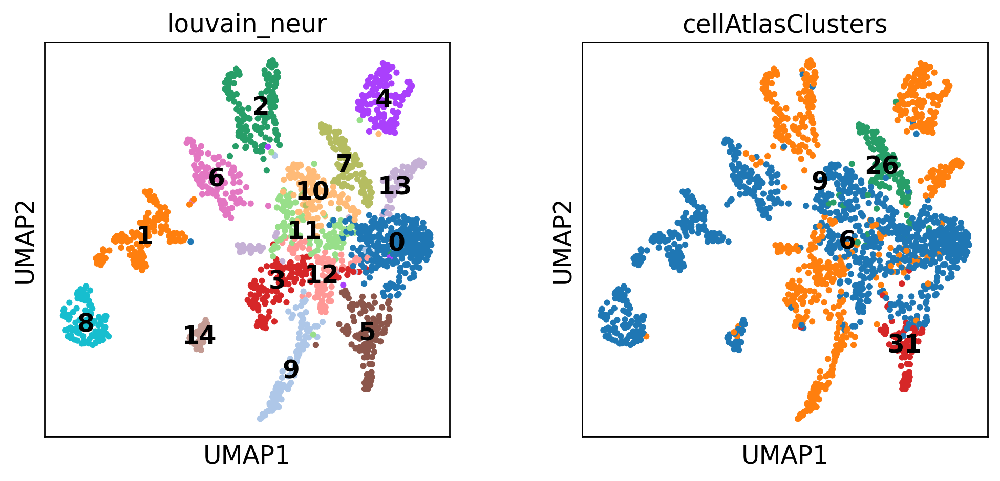

In [ ]:
sc.tl.umap(neurons,random_state=42,spread=2.5, min_dist=1)

neurons.obs['cellAtlasClusters'] = pd.Categorical(neurons.obs['cellRanger_louvain'] )
sc.pl.umap(neurons, color=['louvain_neur','cellAtlasClusters'],color_map='viridis',size=50,legend_loc='on data')

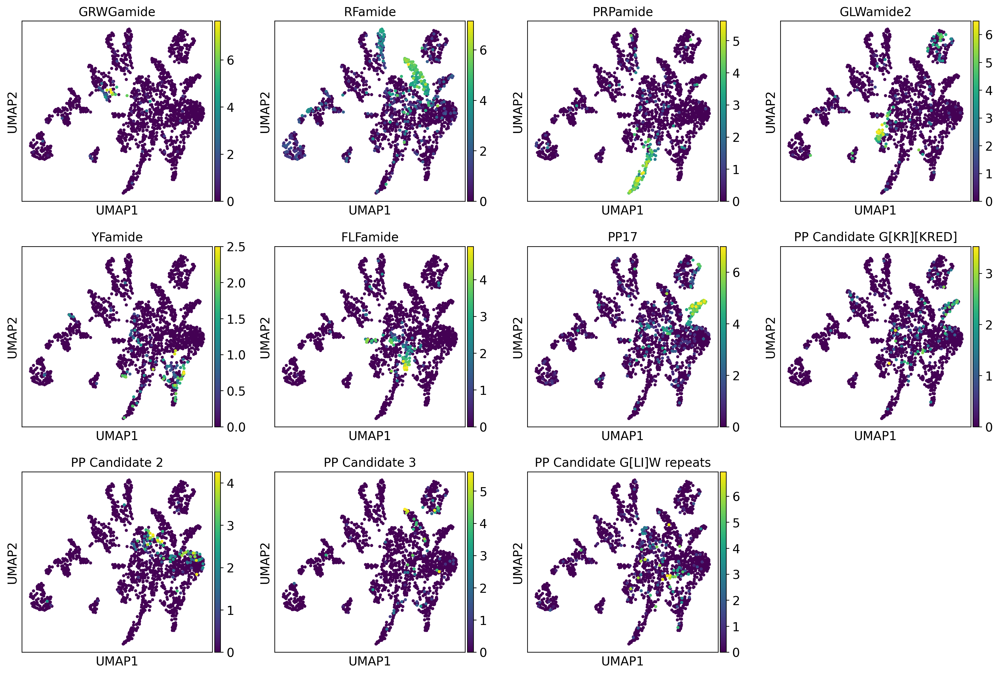

In [ ]:
sc.pl.umap(neurons, color=['XLOC_040584','XLOC_019434','TRINITY_DN20104_c0_g1_i1.mrna1',
                           'XLOC_017097','XLOC_041402','XLOC_004021',
                           'XLOC_030120','XLOC_008730','XLOC_035224','XLOC_021799','XLOC_014624'],color_map='viridis',size=50,legend_loc='on data',
           title=['GRWGamide','RFamide','PRPamide',
                  'GLWamide2','YFamide','FLFamide',
                  'PP17','PP Candidate G[KR][KRED]','PP Candidate 2','PP Candidate 3','PP Candidate G[LI]W repeats'])